In [ ]:
import os

os.getcwd()

In [2]:
#导入所需的库
import os
import torch
import numpy as np
import utils
import data
import train
import preprocess

In [4]:
#读取序列数据和标签文件
fasta_file = '../training/osat_training_SE8k.fa'
tag_file = '../training/osat_training_taglist.txt'
seqs, tags, pos= utils.load_data(fasta_file, label=True, strand=False, pos=True)

with open(tag_file) as f:
    tag_list = f.readlines()

tag_dict = { item.strip():index for index, item in enumerate(tag_list) }     

In [5]:
#数据预处理（序列数据转为one-hot形式，标签转为数字映射）
nuc_pre = preprocess.NucPreprocess(seqs)
X_all = nuc_pre.onehot_for_nuc()
labels = utils.tag_encode(tags, tag_dict, sep=',')

# 水稻的5号染色体作为测试集，8号染色体作为验证集，其余作为训练集
testing_index = [ index for index, item in enumerate(pos) if '5:' in item ]
validation_index = [ index for index, item in enumerate(pos) if '8:' in item ]
training_index = [ i for i in range(len(X_all)) if i not in testing_index and i not in validation_index ]

X_training = [ X_all[i] for i in training_index ]
y_training = np.array([ labels[i] for i in training_index ])

X_validation = [ X_all[i] for i in validation_index ]
y_validation = np.array([ labels[i] for i in validation_index ])

X_testing = [ X_all[i] for i in testing_index ]
y_testing = np.array([ labels[i] for i in testing_index ])

In [5]:
#将数据转为torch的数据集并定义批量大小
train_set = data.NucDataset(x=X_training, y=y_training)
val_set = data.NucDataset(x=X_validation, y=y_validation)


batch_size=64

train_loader = torch.utils.data.DataLoader(dataset=train_set, batch_size=batch_size, shuffle=True, num_workers=0)
val_loader = torch.utils.data.DataLoader(dataset=val_set, batch_size=batch_size, shuffle=True, num_workers=0)

In [6]:
# import importlib
# importlib.reload(explain)
# import explain_model as explain

# import importlib
# importlib.reload(sei)

import sei_model as sei

In [7]:
#导入模型，设置超参数
import sei_model as sei

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cpu = torch.device('cpu')

epoch = 15
lr = 1e-5
#获取序列长度和标签维度
seq_len = len(seqs[0])
feature_size = len(tag_dict)

#初始化模型
model = sei.Sei(sequence_length=seq_len, n_genomic_features=len(tag_dict))
model = model.to(device)

In [8]:
# k - kernel size
# fc - num_fc
# p - pool_size/stride
# u - num_cnn_units
# seq - seq_length

#模型命名和查看模型结构
record_pattern = 'sei_seq{}_nip_feature{}'.format(seq_len, len(tag_dict))

model_dir = '../model/{}.model'.format(record_pattern)

model

Sei(
  (lconv1): Sequential(
    (0): Conv1d(4, 480, kernel_size=(9,), stride=(1,), padding=(4,))
    (1): Conv1d(480, 480, kernel_size=(9,), stride=(1,), padding=(4,))
  )
  (conv1): Sequential(
    (0): Conv1d(480, 480, kernel_size=(9,), stride=(1,), padding=(4,))
    (1): ReLU(inplace=True)
    (2): Conv1d(480, 480, kernel_size=(9,), stride=(1,), padding=(4,))
    (3): ReLU(inplace=True)
  )
  (lconv2): Sequential(
    (0): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
    (1): Dropout(p=0.2, inplace=False)
    (2): Conv1d(480, 640, kernel_size=(9,), stride=(1,), padding=(4,))
    (3): Conv1d(640, 640, kernel_size=(9,), stride=(1,), padding=(4,))
  )
  (conv2): Sequential(
    (0): Dropout(p=0.2, inplace=False)
    (1): Conv1d(640, 640, kernel_size=(9,), stride=(1,), padding=(4,))
    (2): ReLU(inplace=True)
    (3): Conv1d(640, 640, kernel_size=(9,), stride=(1,), padding=(4,))
    (4): ReLU(inplace=True)
  )
  (lconv3): Sequential(
    (0): MaxPool1d(ke

In [ ]:
#训练分类器
train.training_classifier(batch_size=batch_size, n_epoch=epoch, lr=lr, model_dir=model_dir, 
                             train=train_loader, valid=val_loader, model=model, device=device)


Start training, parameters total: 80920143, trainable: 80920143



//mnt/Omics2/zhouxk/anaconda3/envs/ML/lib/python3.9/site-packages/torch/nn/modules/conv.py:309: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at /opt/conda/conda-bld/pytorch_1682343997789/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)


[ Epoch1: 3339/3339 ] loss:0.319 
Train | Loss:0.42816
Valid | Loss:0.38173 
saving model with loss 112.993
-----------------------------------------------
[ Epoch2: 3339/3339 ] loss:0.343 
Train | Loss:0.36372
Valid | Loss:0.35529 
saving model with loss 105.165
-----------------------------------------------
[ Epoch3: 3339/3339 ] loss:0.322 
Train | Loss:0.34183
Valid | Loss:0.34387 
saving model with loss 101.785
-----------------------------------------------
[ Epoch4: 3339/3339 ] loss:0.222 
Train | Loss:0.32316
Valid | Loss:0.34246 
saving model with loss 101.367
-----------------------------------------------
[ Epoch5: 3339/3339 ] loss:0.382 
Train | Loss:0.30728
Valid | Loss:0.34619 
-----------------------------------------------
[ Epoch6: 3339/3339 ] loss:0.266 
Train | Loss:0.29438
Valid | Loss:0.34370 
-----------------------------------------------
[ Epoch7: 3339/3339 ] loss:0.347 
Train | Loss:0.28360
Valid | Loss:0.33163 
saving model with loss 98.163
-------------------

In [9]:
#测试集评估模型
batch_size=64
seq_len = len(seqs[0])
record_pattern = 'sei_seq{}_nip_feature{}'.format(seq_len, len(tag_dict))
model_dir = '../model/{}.model'.format(record_pattern)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cpu = torch.device('cpu')


test_dataset = data.NucDataset(x=X_testing, y=y_testing)

test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

model = torch.load(model_dir).to(device)
model.eval()

total_correct = 0
nfeature = len(tag_dict)

total_labels = torch.tensor([[0]*nfeature],dtype=torch.float)
total_outputs = torch.tensor([[0]*nfeature],dtype=torch.float)

with torch.no_grad():
    for i, (inputs, labels) in enumerate(test_loader):
        inputs = inputs.to(device, dtype=torch.float)
        inputs = inputs.permute(0,2,1)
        outputs = model(inputs)
        outputs = outputs.squeeze()
        total_outputs = torch.concat((total_outputs, outputs.to(torch.device('cpu'),dtype=torch.float)))
        total_labels = torch.concat((total_labels, labels))
        labels = labels.to(device, dtype=torch.float)
        correct = utils.evaluation(outputs, labels)
        total_correct += correct    
        
trans_final_correct = total_correct/(len(test_dataset)*nfeature)
print('Testing correct: {:.2f}%'.format(trans_final_correct*100))

total_labels = total_labels[1:,:].numpy()
total_outputs = total_outputs[1:,:].numpy()

test_prediction = {'predictions':total_outputs,'targets':total_labels}
np.save('../model/{}.test_predictions.npy'.format(record_pattern), test_prediction)

//mnt/Omics2/zhouxk/anaconda3/envs/ML/lib/python3.9/site-packages/torch/nn/modules/conv.py:309: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at /opt/conda/conda-bld/pytorch_1682343997789/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)


Testing correct: 86.10%


> Test TSei

In [9]:
#重新导入sei模型和测试数据集
test_dataset = data.NucDataset(x=X_testing, y=y_testing)

test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

import importlib
importlib.reload(sei)

In [11]:
import importlib
importlib.reload(sei)

<module 'sei_model' from '/mnt/Omics2/zhouxk/DL_IN_Plant/SEI/experiment/model/code/sei_model.py'>

In [12]:
#重新导入Tsei测试
model_t = sei.TSei(sequence_length=seq_len, n_genomic_features=len(tag_dict))

model_t.to(device).eval()

with torch.no_grad():
    for i, (inputs, labels) in enumerate(test_loader):
        inputs = inputs.to(device, dtype=torch.float)
        inputs = inputs.permute(0,2,1)
        outputs = model_t(inputs)
        break

In [14]:
model_t

TSei(
  (lconv1): Sequential(
    (0): Conv1d(4, 480, kernel_size=(9,), stride=(1,), padding=(4,))
    (1): Conv1d(480, 480, kernel_size=(9,), stride=(1,), padding=(4,))
  )
  (conv1): Sequential(
    (0): Conv1d(480, 480, kernel_size=(9,), stride=(1,), padding=(4,))
    (1): ReLU(inplace=True)
    (2): Conv1d(480, 480, kernel_size=(9,), stride=(1,), padding=(4,))
    (3): ReLU(inplace=True)
  )
  (lconv2): Sequential(
    (0): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
    (1): Dropout(p=0.2, inplace=False)
    (2): Conv1d(480, 640, kernel_size=(9,), stride=(1,), padding=(4,))
    (3): Conv1d(640, 640, kernel_size=(9,), stride=(1,), padding=(4,))
  )
  (conv2): Sequential(
    (0): Dropout(p=0.2, inplace=False)
    (1): Conv1d(640, 640, kernel_size=(9,), stride=(1,), padding=(4,))
    (2): ReLU(inplace=True)
    (3): Conv1d(640, 640, kernel_size=(9,), stride=(1,), padding=(4,))
    (4): ReLU(inplace=True)
  )
  (lconv3): Sequential(
    (0): MaxPool1d(k

In [13]:
outputs

tensor([[0.4590, 0.5367, 0.4154,  ..., 0.4825, 0.6924, 0.4643],
        [0.4565, 0.5259, 0.4145,  ..., 0.4750, 0.6915, 0.4627],
        [0.4633, 0.5280, 0.4136,  ..., 0.4810, 0.6800, 0.4489],
        ...,
        [0.4630, 0.5396, 0.4067,  ..., 0.4811, 0.6855, 0.4621],
        [0.4493, 0.5583, 0.4136,  ..., 0.4725, 0.6795, 0.4636],
        [0.4622, 0.5336, 0.4103,  ..., 0.4838, 0.6974, 0.4626]],
       device='cuda:0')

In [3]:
# prediction
import explain_model as explain

prediction_fa_list = ['../genome/osat_1k_200s_filtered_00.fa', '../genome/osat_1k_200s_filtered_01.fa']

## Note: This is indepent param
record_pattern = 'explain_k19_fc2_p7_u200_seq1000'
model_dir = '../model/{}.model'.format(record_pattern)

## Restart varibles which will be cleared
batch_size=128
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cpu = torch.device('cpu')
tag_file = '../training_data/osat_training_taglist.txt'
with open(tag_file) as f:
    tag_list = f.readlines()

In [ ]:
#预测多个序列
model = torch.load(model_dir).to(device)
model.eval()

tag_dict = { item.strip():index for index, item in enumerate(tag_list) }
nfeature = len(tag_dict)
total_pre = torch.tensor([[0]*nfeature],dtype=torch.float)

for prediction_fa in prediction_fa_list:
    pre_seqs = utils.load_data(prediction_fa)
    print('Total {} seqs from {}'.format(len(pre_seqs), prediction_fa))

    pre_nuc_pre = preprocess.NucPreprocess(pre_seqs)
    pre_X_all = pre_nuc_pre.onehot_for_nuc()
    print('Encoding done')

    pre_dataset = data.NucDataset(x=pre_X_all, y=[0]*len(pre_X_all))
    pre_loader = torch.utils.data.DataLoader(dataset=pre_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

    with torch.no_grad():
        print('Start prediction, total: ', len(pre_X_all))
        for i, (inputs, _) in enumerate(pre_loader):
            inputs = inputs.to(device, dtype=torch.float)
            outputs = model(inputs)
            outputs = outputs.squeeze()
            total_pre = torch.concat((total_pre, outputs.to(cpu, dtype=torch.float)))
            if i%5000 == 0:
                print(i, i/len(pre_loader))

total_pre = total_pre[1:].numpy()
np.save('../prediction/predicted_matrix_{}'.format(record_pattern),total_pre)

In [5]:
total_pre.shape

(1869142, 500)

In [6]:
# PCA
#对预测结果降维
from sklearn.decomposition import IncrementalPCA

total_pre = np.load('../prediction/predicted_matrix_{}.npy'.format(record_pattern))
PCA_transformer = IncrementalPCA(n_components=300, batch_size=100000)
PCA_pre = PCA_transformer.fit_transform(total_pre)
PCA_pre.shape
np.save('../visualization/{}_1k_IPCA_300'.format(record_pattern), PCA_pre)

In [7]:
PCA_ratio_threshold = 1e-4

PCA_threshold = len(PCA_transformer.explained_variance_ratio_[PCA_transformer.explained_variance_ratio_>=PCA_ratio_threshold])
import pandas as pd

top_pca = PCA_transformer.explained_variance_ratio_[:10]

pca_ratio = pd.DataFrame(np.vstack((np.arange(len(top_pca)),top_pca)))
pca_ratio = pca_ratio.T

In [8]:
import pandas as pd

top_pca = PCA_transformer.explained_variance_ratio_[:10]

pca_ratio = pd.DataFrame(np.vstack((np.arange(len(top_pca)),top_pca)))
pca_ratio = pca_ratio.T

In [9]:
pca_ratio.columns = ['X','Y']
pca_ratio

,X,Y
0,0.0,0.587551
1,1.0,0.176012
2,2.0,0.111226
3,3.0,0.042901
4,4.0,0.020918
5,5.0,0.018198
6,6.0,0.007186
7,7.0,0.004472
8,8.0,0.003725
9,9.0,0.003337


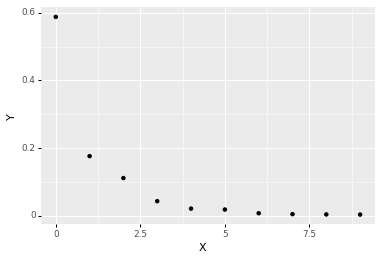

<ggplot: (109345388523)>

In [10]:
from plotnine import *
p = (ggplot(pca_ratio, aes(x='X',y='Y'))+geom_point())
p

In [11]:
PCA_threshold = 4

pcadata = PCA_pre[:,:PCA_threshold]
pcadata.shape

(1869142, 4)

In [ ]:
# lovain

import nmslib
import numpy as np
import louvain
import igraph as ig
from scipy.sparse import csgraph, csr_matrix

def knn_graph(X, n_neighbors=15, space='l2', num_threads=8, params={'post': 2}):
    """    space: string
            The metric/non-metric distance functions to use to compute distances.
            see https://github.com/nmslib/nmslib/blob/master/manual/manual.pdf
                * bit_hamming
                * l1
                * l1_sparse
                * l2 -> Euclidean distance
                * l2_sparse
                * linf
                * linf_sparse
                * lp:p=...
                * lp_sparse:p=...
                * angulardist, angulardist sparse, angulardist sparse fast
                * jsmetrslow, jsmetrfast, jsmetrfastapprox
                * leven
                * sqfd minus func, sqfd heuristic func:alpha=..., sqfd gaussian func:alpha=...
                * jsdivslow, jsdivfast, jsdivfastapprox
                * cosinesimil, cosinesimil sparse, cosinesimil sparse
                * normleven
                * kldivfast
                * kldivgenslow, kldivgenfast, kldivgenfastrq
                * itakurasaitoslow, itakurasaitofast, itakurasaitofastrq
                * negdotprod_sparse
                * querynorm_negdotprod_sparse
                * renyi_diverg
                * ab_diverg
    """
    index = nmslib.init(method='hnsw', space=space)
    index.addDataPointBatch(X)
    index.createIndex(params, print_progress=False)
    neighbours = index.knnQueryBatch(X, k=n_neighbors, num_threads=num_threads)
    ind = np.vstack([i for i,d in neighbours])
    sind=np.repeat(np.arange(ind.shape[0]), ind.shape[1])
    tind=ind.flatten()
    g = csr_matrix((np.ones(ind.shape[0]*ind.shape[1]),(sind,tind)),(ind.shape[0],ind.shape[0]))
    return g

pcadata_sd = pcadata.std(axis=0)
pcadata = pcadata/(pcadata_sd)
g = knn_graph(pcadata, n_neighbors=20, num_threads=10)

sources, targets = g.nonzero()
edgelist = zip(sources.tolist(), targets.tolist())
G = ig.Graph(g.shape[0],list(edgelist))
partitionl = louvain.find_partition(G, louvain.ModularityVertexPartition)
np.save('../visualization/{}.louvain.npy'.format(record_pattern),partitionl.membership)

In [13]:
from sklearn.model_selection import GridSearchCV # 通过网格方式来搜索参数
from sklearn import datasets
from sklearn.neighbors import KNeighborsClassifier

data = np.load('../visualization/{}_1k_IPCA_300.npy'.format(record_pattern))
data.shape

(1869142, 300)

In [14]:
# visualization
import numpy as np

c = np.load('../visualization/{}.louvain.npy'.format(record_pattern))

PCA_threshold = 4

data = data[:,:PCA_threshold]
data = data/data.std(axis=0)[None,:]

In [ ]:
import nmslib

index = nmslib.init(method='hnsw', space='l2', space_params={'post': 2})
index.addDataPointBatch(data)
index.createIndex({'post': 2}, print_progress=False)
neighbors = index.knnQueryBatch(data, k=25, num_threads=10)

ind = np.vstack([i[:20] for i, d in neighbors])
dist = np.vstack([d[:20] for i, d in neighbors])
beta= np.sum((np.log(dist[:,1:])-np.mean(np.log(dist[:,1:]),axis=1)[:,None])*(np.log(np.arange(1, 20)) - np.mean(np.log(np.arange(1,20))))[None,:],axis=1)/np.sum((np.log(dist[:,1:])-np.mean(np.log(dist[:,1:]),axis=1)[:,None])**2,axis=1)

In [16]:
allinds = (dist[:,1]!=0)* (beta < 180) 
logp = np.log(dist[allinds,1])*beta[allinds]
np.random.seed(0)
s =  logp + np.random.gumbel(size=logp.shape)
import umap.umap_ as umap
selectinds = np.argsort(-s)[:50000]
vis_sub50000 = umap.UMAP(min_dist=0.,metric='euclidean').fit_transform(data[allinds,:][selectinds,:])

np.save('../visualization/{}_umap.univar.subsample.beta.50000.euclidean.npy'.format(record_pattern), vis_sub50000)
np.save('../visualization/{}_umap.univar.subsample.beta.50000.euclidean.inds.npy'.format(record_pattern), np.where(allinds)[0][selectinds])

In [17]:
init = np.load('../visualization/{}_umap.univar.subsample.beta.50000.euclidean.npy'.format(record_pattern))
inds = np.load('../visualization/{}_umap.univar.subsample.beta.50000.euclidean.inds.npy'.format(record_pattern))

In [ ]:
from openTSNE import *
N = 50000
N2 = 25000
perplexity = 200
exaggeration = 1.5
ee = 3
ee2 = 1.5

np.random.seed(0)

sample_affinities = affinity.PerplexityBasedNN(
    np.vstack(data[inds,:]),
    perplexity=perplexity,
    method="approx",
    n_jobs=40,
    random_state=0,
)

sample_embedding = TSNEEmbedding(
    init,
    sample_affinities,
    negative_gradient_method="fft",
    n_jobs=40,
)
sample_embedding.optimize(n_iter=250, exaggeration=ee, momentum=0.5, inplace=True, learning_rate=1000)
sample_embedding.optimize(n_iter=750, exaggeration=exaggeration, momentum=0.8, inplace=True, learning_rate=1000)
np.random.seed(0)
inds2  = np.unique(np.random.randint(0, data.shape[0], N2+100000))[:N2]

rest_init = sample_embedding.prepare_partial(data[inds2,:], k=1, perplexity=1/3)

init_full = np.zeros((len(inds)+len(inds2),2))
init_full[:len(inds)] = sample_embedding
init_full[len(inds):] = rest_init

affinities = affinity.PerplexityBasedNN(
    data[np.concatenate([inds,inds2]),:],
    perplexity=perplexity,
    method="approx",
    n_jobs=40,
    random_state=0,
)

embedding = TSNEEmbedding(
    init_full,
    affinities,
    learning_rate=1000,
    negative_gradient_method="fft",
    n_jobs=40,
    random_state=42,
)
embedding = embedding.optimize(n_iter=250, exaggeration=ee2, momentum=0.5)
embedding1 = embedding.optimize(n_iter=500, exaggeration=exaggeration, momentum=0.5)
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
init_notebook_mode()

traces = [go.Scattergl(
     x = np.asarray(embedding1[c[np.concatenate([inds,inds2])]==uc,0][:50000]).flatten(),
     y = np.asarray(embedding1[c[np.concatenate([inds,inds2])]==uc,1][:50000]).flatten(),
     #text = str(uc),
     marker=dict(
         size=2,
         opacity=0.5

     ),
     mode='markers',
    name = str(uc)
 ) for uc in np.unique(c[np.concatenate([inds,inds2])])]

plot(go.Figure(data=traces).update_layout(template='plotly_white'),filename='../visualization//{}_vis.html'.format(record_pattern))

In [10]:
from scipy.stats import rankdata

ORDERING = np.load('../prediction/corr_ordering_{}.npy'.format(record_pattern))

ordered_mat = mat[ORDERING][:,ORDERING]

rankmat = rankdata(ordered_mat).reshape(ordered_mat.shape)
rankmat

array([[249602. , 236229.5, 231495.5, ...,  39340. , 113613.5,  77535.5],
       [236229.5, 249526.5, 241847. , ...,  53053.5, 130900. ,  90757. ],
       [231495.5, 241848. , 249826. , ...,  47091.5, 132507.5,  89169.5],
       ...,
       [ 39339. ,  53053.5,  47091.5, ..., 249826. , 149459.5, 167971. ],
       [113613.5, 130899. , 132507.5, ..., 149459.5, 249826. , 149087.5],
       [ 77535.5,  90758. ,  89169.5, ..., 167972. , 149087.5, 249602. ]])

In [11]:
import numpy as np
from collections import Counter
import pandas as pd

predict_max_ind = np.argmax(total_pre, axis=1)

In [14]:
tag_file = '../training_data/osat_training_taglist.txt'

with open(tag_file) as f:
    tag_list = f.readlines()
    
tag_ind_dict = { index:item.strip() for index, item in enumerate(tag_list) }

In [ ]:
cluster_dict = dict()
for i, ind in enumerate(predict_max_ind):
    cluster = c[i]
    tag = tag_ind_dict[ind]
    if cluster in cluster_dict:
        cluster_dict[cluster].append(tag)
    else:
        cluster_dict[cluster] = [tag]

In [35]:
cluster_dict

{24: ['K27me1_atxr',
  'HON5',
  'HTA11_27c_15min',
  'ZFHD_tnt_ATHB34_colamp',
  'MYC3_DAP',
  'HTR13',
  'HON5',
  'HTA11_17c_4hr',
  'HON5',
  'K27me1_atxr',
  'K27me1_atxr',
  'HON5',
  'HON5',
  'K27me1_atxr',
  'H3K9me2_edm3',
  'CPP_tnt_AT2G20110_colamp',
  'CPP_tnt_AT2G20110_colamp',
  'H3K9me2_edm3',
  'H3K9me2_crh63',
  'HTA11_17c_4hr',
  'WT_H3K9me1',
  'K27me1_atxr',
  'HTR13',
  'K27me1_atxr',
  'H3K9me2_WT',
  'NFYB2_ABA',
  'K27me1_atxr',
  'K27me1_atxr',
  'H3ac_hda6_ldl12',
  'H3K9me2_edm3',
  'HTR13',
  'HON5',
  'WT_H3K9me1',
  'K27me1_atxr',
  'NFYB2_ABA',
  'K27me1_atxr',
  'Col_H3',
  'CPP_tnt_AT2G20110_colamp',
  'HTA11_17c_4hr',
  'K27me1_atxr',
  'NDX',
  'h2aw2_H3K9me1',
  'K27me1_atxr',
  'H3K9me2_edm3',
  'HON5',
  'MYC3_DAP',
  'ZFHD_tnt_ATHB34_colamp',
  'HON5',
  'NFYB2_ABA',
  'HB6_ABA',
  'WT_H3K9me1',
  'K9me2_se_2',
  'H3K9me2_edm3',
  'ZFHD_tnt_ATHB34_colamp',
  'H3K9me1_WT',
  'K27me1_atxr',
  'HON5',
  'HON5',
  'NFYB2_ABA',
  'HTR13',
  'CPP_tnt_A

24 ['K27me1_atxr', 'HON5'] 649 482
2 ['HON5', 'MYC3_DAP'] 3209 1298
4 ['H3K27me3_flower', 'HON5'] 785 616
7 ['HTA11_27c_4hr', 'H3ac_hda6_ldl12'] 2676 104
6 ['H3K4me1_fld', 'H3K4me1_suvh456'] 2127 457
9 ['H3K4me1_bte1', 'H3K4me1_fld'] 969 2359
20 ['H3K4me1_fld', 'WT_H2A'] 1566 101
14 ['H3K4me1_Col-0', 'H3K36me3_Col-0'] 869 485
11 ['HTA11_17c_4hr', 'H3K4me3_WT_AB'] 332 20
19 ['MYC3_DAP', 'HON5'] 149 2135
15 ['H3K27me3_t2', 'HTR13'] 231 191
0 ['HON5', 'NDX'] 7699 6
10 ['Col_H3', 'HTA11_27c_4hr'] 455 1988
5 ['H3K4me2_WT_CIM14', 'HTA11_27c_4hr'] 295 387
8 ['H3K4me1_fld', 'WT_H2A'] 1007 876
13 ['H3K4me1_suvh456', 'H3K4me1_WT_CIM14'] 982 907
22 ['HTR13', 'H3K4me1_suvh456'] 568 788
17 ['WT_H2A', 'H3K36me3_WT_pCpL'] 35 41
25 ['WT_H2A', 'H3K27me3_pkl'] 23 838
12 ['HTA11_17c_4hr', 'HON5'] 1281 1341
16 ['HTR13', 'H3K4me1_ldl3_CIM14'] 1634 164
3 ['H3K4me1_WT_C', 'H3K4me1_WT_CIM14'] 150 868
23 ['H3K9me2_col_wt_x_col_adm', 'HTR13'] 19 1406
21 ['HON5', 'NFYB2_ABA'] 1535 104
18 ['DMS3_ZF_Col0', 'H3K4me

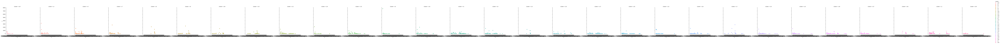

In [36]:
for i in cluster_dict:
    try:
        if i == list(cluster_dict.keys())[0]:
            a = Counter(cluster_dict[i])
            print(i, list(a.keys())[0:2], a[list(a.keys())[0]], a[list(a.keys())[1]])
            b = pd.DataFrame(pd.Series(a))
            b['cluster'] = 'c'+str(i)
            b['x'] = b.index
            b.columns = ['y','cluster','x']
        else:
            a = Counter(cluster_dict[i])
            print(i, list(a.keys())[0:2], a[list(a.keys())[0]], a[list(a.keys())[1]])
            c = pd.DataFrame(pd.Series(a))
            c['cluster'] = 'c'+str(i)
            c['x'] = c.index
            c.columns = ['y','cluster','x']
            b = pd.concat((b,c))
    except:
        print(i)
sns.relplot(data=b,x='x',y='y', hue='cluster', col='cluster')

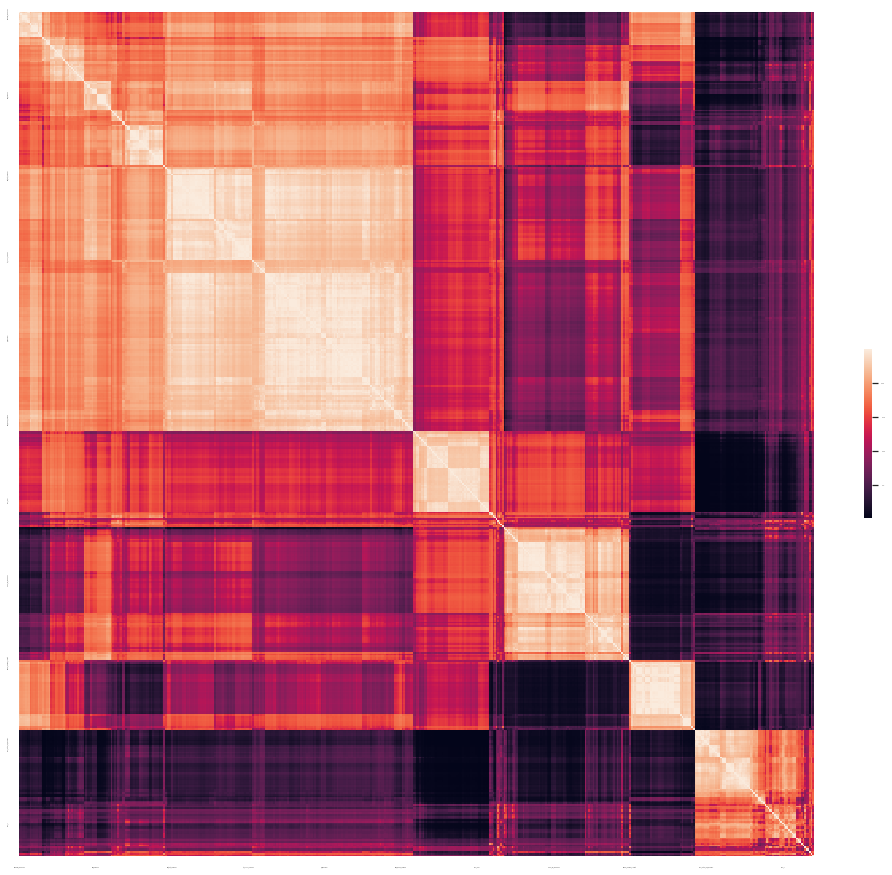

In [16]:
PROFILES = [ tag_ind_dict[i] for i in ORDERING ]

df = pd.DataFrame(rankmat)
df.columns = PROFILES
df.rename(index={i: l for (i, l) in enumerate(PROFILES)},inplace=True)

import matplotlib.pyplot as plt

sns.set(font_scale=0.10)
plt.figure(figsize=(14, 12))
ax = sns.heatmap(df, xticklabels=48, yticklabels=48,
                 cbar_kws={'shrink': 0.2})
plt.tight_layout()

In [65]:
bam_df = pd.read_csv('../prediction/osat_all.bamcov_record.tsv', sep="\t")

# stander_scale
bam_df = (bam_df-bam_df.min())/(bam_df.max()-bam_df.min())


bam_mat = bam_df.to_numpy()
bam_mat = bam_mat.T

bam_mat_cor = np.corrcoef(bam_mat)

ORDERING = np.load('../prediction/corr_ordering_{}.npy'.format(record_pattern))
ordered_bam_mat = bam_mat_cor[ORDERING][:,ORDERING]

from scipy.stats import rankdata

rankbammat = rankdata(ordered_bam_mat).reshape(ordered_bam_mat.shape)
rankbammat

array([[226394.5, 210909.5, 206201.5, ...,  13901.5, 139201.5,  54953.5],
       [210909.5, 226394.5, 209963. , ..., 154883.5, 170411.5, 173176. ],
       [206201.5, 209964. , 226394.5, ...,   2246. , 172277.5, 150055.5],
       ...,
       [ 13901.5, 154883.5,   2245. , ..., 226394.5, 135752. , 155481.5],
       [139201.5, 170411.5, 172277.5, ..., 135751. , 226394.5, 103527.5],
       [ 54953.5, 173175. , 150055.5, ..., 155481.5, 103527.5, 226394.5]])

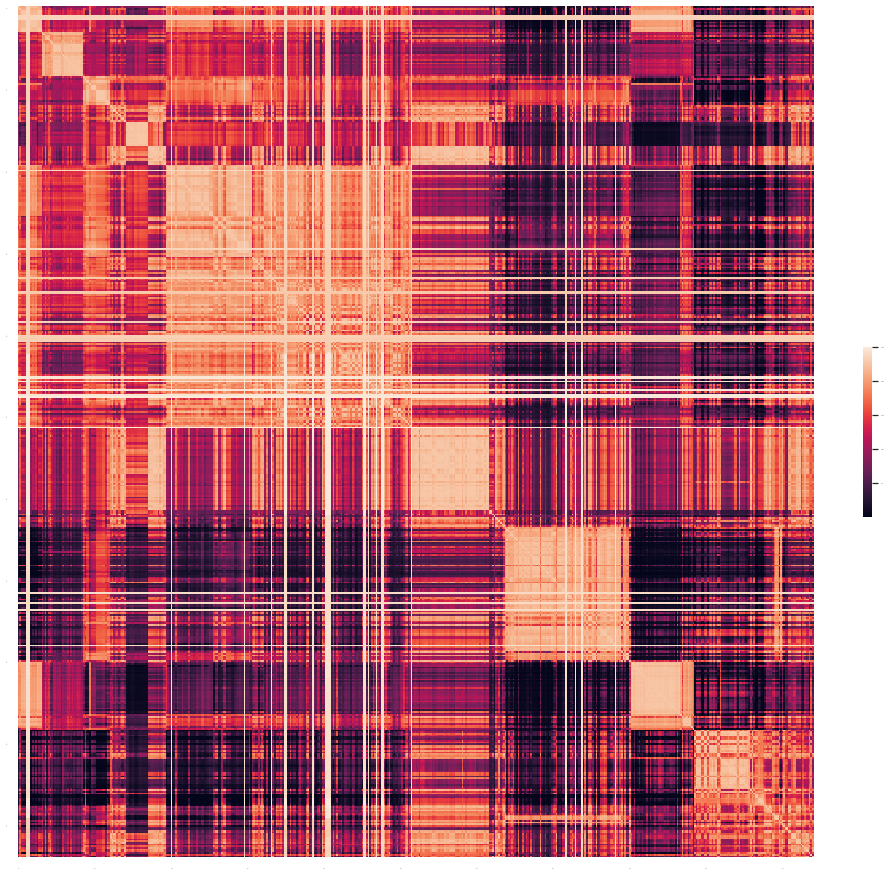

In [18]:
import matplotlib.pyplot as plt

sns.set(font_scale=0.10)
plt.figure(figsize=(14, 12))
ax = sns.heatmap(rankbammat, xticklabels=48, yticklabels=48,
                 cbar_kws={'shrink': 0.2})
plt.tight_layout()

Text(0.5, 1.0, 'Real')

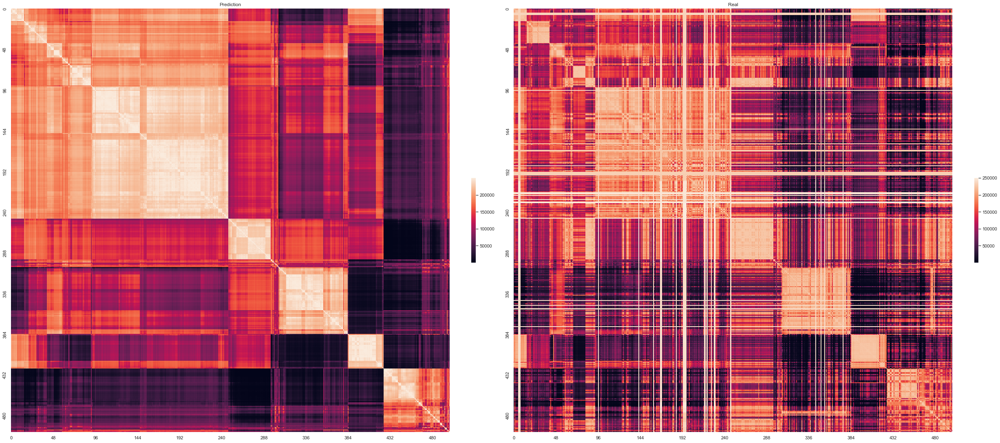

In [66]:
sns.set(font_scale=1)
fig, axs=plt.subplots(1, 2, constrained_layout=True, figsize=(34, 15))

ax = sns.heatmap(rankmat, xticklabels=48, yticklabels=48,
                 cbar_kws={'shrink': 0.2},ax=axs[0])
ax.set_title('Prediction')

ax = sns.heatmap(rankbammat, xticklabels=48, yticklabels=48,
                 cbar_kws={'shrink': 0.2},ax=axs[1])
ax.set_title('Real')

In [31]:
# Delete predict record without bam
total_pre = np.load('../prediction/predicted_matrix_{}.npy'.format(record_pattern))

with open('../bam_cov/no_bam.list') as f:
    no_bam = [rec.strip() for rec in f.readlines()]
    
no_bam_index = [ tag_dict[rec] for rec in no_bam ]
no_bam_pre = np.delete(total_pre, no_bam_index, axis=1)
no_bam_pre.shape

(1869142, 476)

D:\Anaconda3\envs\ML\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.


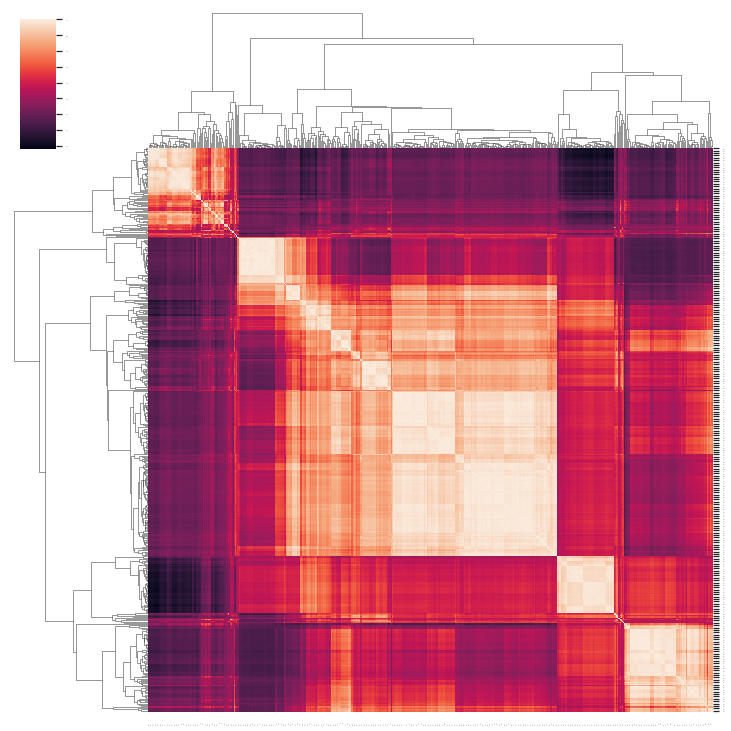

In [44]:
no_bam_predict_profile = no_bam_pre.T

no_bam_mat = np.corrcoef(no_bam_predict_profile)

no_bam_cm = sns.clustermap(no_bam_mat)
np.save('../bam_cov/no_bam_corr_ordering_{}'.format(record_pattern),no_bam_cm.dendrogram_col.reordered_ind)

In [47]:
no_bam_ORDERING = np.load('../bam_cov/no_bam_corr_ordering_{}.npy'.format(record_pattern))

no_bam_ordered_mat = no_bam_mat[no_bam_ORDERING][:,no_bam_ORDERING]

no_bam_rankmat = rankdata(no_bam_ordered_mat).reshape(no_bam_ordered_mat.shape)
no_bam_rankmat

array([[226408. , 221827.5, 221953.5, ...,  35397.5,  22857.5,  24087.5],
       [221827.5, 226408. , 224835.5, ...,  36663.5,  23344. ,  24626. ],
       [221953.5, 224835.5, 226408. , ...,  38251.5,  24946. ,  26327.5],
       ...,
       [ 35397.5,  36663.5,  38251.5, ..., 226124. , 212294. , 212635.5],
       [ 22857.5,  23343. ,  24945. , ..., 212293. , 226408. , 226041.5],
       [ 24087.5,  24625. ,  26327.5, ..., 212635.5, 226041.5, 226408. ]])

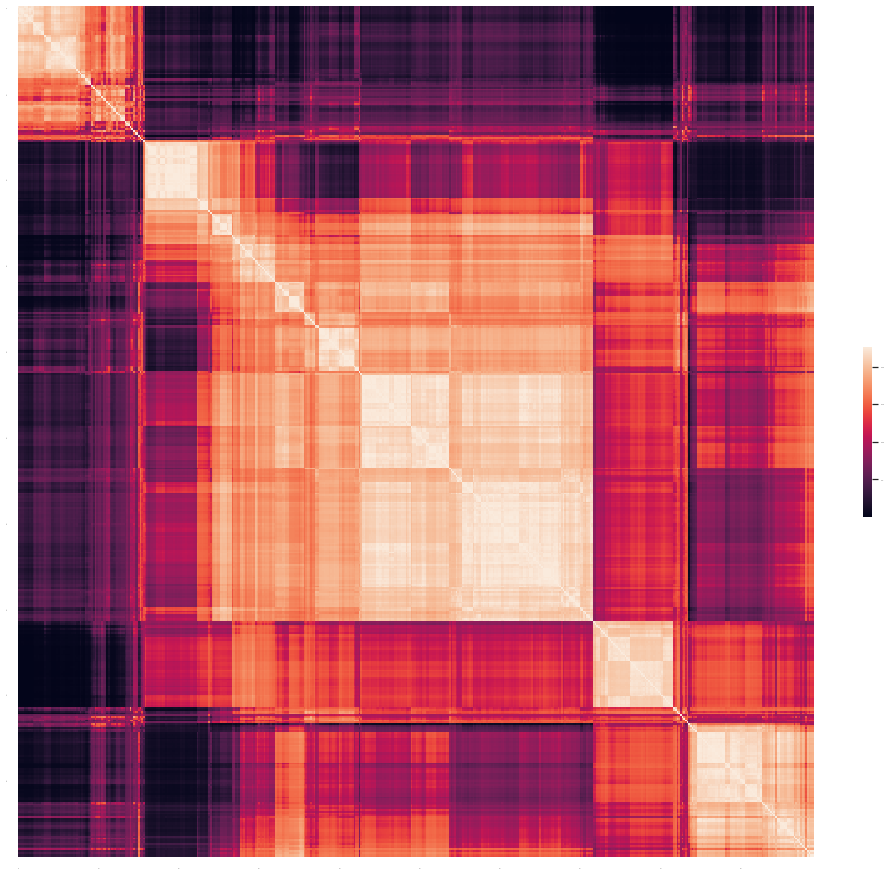

In [48]:
import matplotlib.pyplot as plt

sns.set(font_scale=0.10)
plt.figure(figsize=(14, 12))
ax = sns.heatmap(no_bam_rankmat, xticklabels=48, yticklabels=48,
                 cbar_kws={'shrink': 0.2})
plt.tight_layout()

In [68]:
bam_df = pd.read_csv('../bam_cov/osat_withoutNobam.bamcov_record.tsv', sep="\t")

# stander_scale
bam_df = (bam_df-bam_df.min())/(bam_df.max()-bam_df.min())

# z-score
# bam_df = (bam_df-bam_df.mean())/bam_df.std()

bam_mat = bam_df.to_numpy()
bam_mat = bam_mat.T

bam_mat_cor = np.corrcoef(bam_mat)

no_bam_ORDERING = np.load('../bam_cov/no_bam_corr_ordering_{}.npy'.format(record_pattern))
ordered_bam_mat = bam_mat_cor[no_bam_ORDERING][:,no_bam_ORDERING]

from scipy.stats import rankdata

rankbammat = rankdata(ordered_bam_mat).reshape(ordered_bam_mat.shape)
rankbammat

array([[226096.5, 165657.5, 166385.5, ...,  69747. ,   5803.5,   7118. ],
       [165657.5, 226394. , 223575. , ..., 121549. ,  24294. ,  26309.5],
       [166385.5, 223576. , 226167. , ..., 168087.5,  39301. ,  46039. ],
       ...,
       [ 69748. , 121550. , 168087.5, ..., 226394. , 203932. , 205445.5],
       [  5803.5,  24293. ,  39302. , ..., 203931. , 226167. , 225974. ],
       [  7117. ,  26309.5,  46040. , ..., 205445.5, 225973. , 226167. ]])

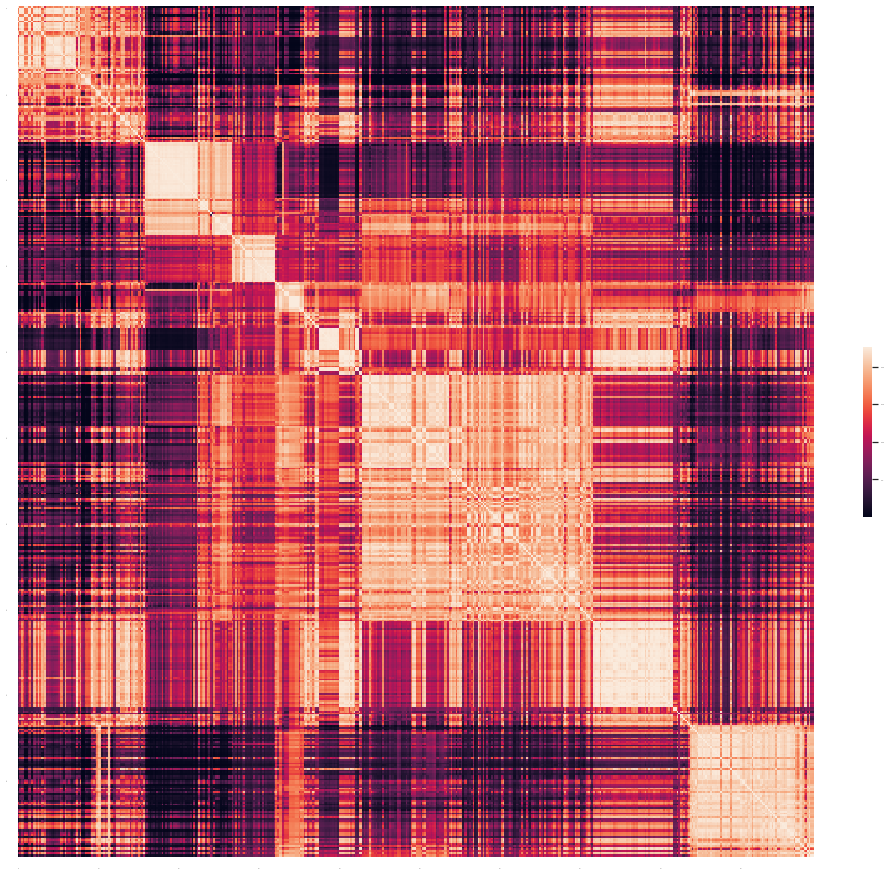

In [52]:
import matplotlib.pyplot as plt

sns.set(font_scale=0.10)
plt.figure(figsize=(14, 12))
ax = sns.heatmap(rankbammat, xticklabels=48, yticklabels=48,
                 cbar_kws={'shrink': 0.2})
plt.tight_layout()

Text(0.5, 1.0, 'Real')

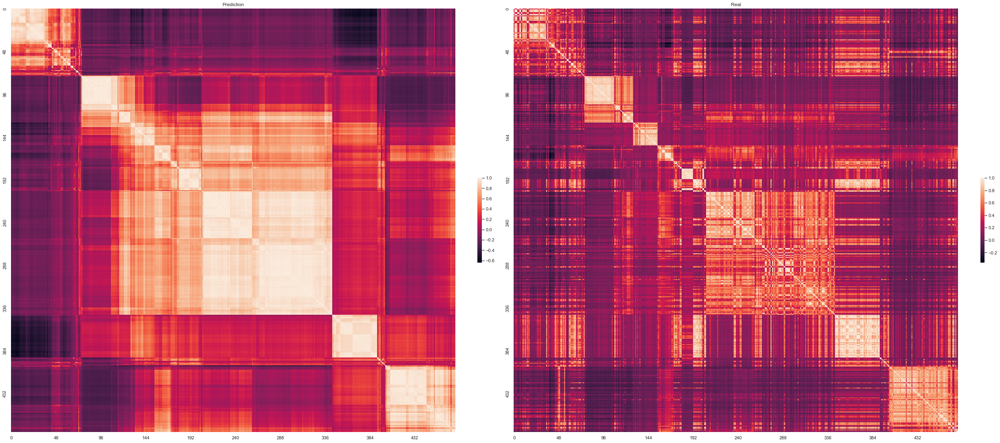

In [72]:
sns.set(font_scale=1)
fig, axs=plt.subplots(1, 2, constrained_layout=True, figsize=(34, 15))

ax = sns.heatmap(no_bam_ordered_mat, xticklabels=48, yticklabels=48,
                 cbar_kws={'shrink': 0.2},ax=axs[0])
ax.set_title('Prediction')

ax = sns.heatmap(ordered_bam_mat, xticklabels=48, yticklabels=48,
                 cbar_kws={'shrink': 0.2},ax=axs[1])
ax.set_title('Real')

Text(0.5, 1.0, 'Real')

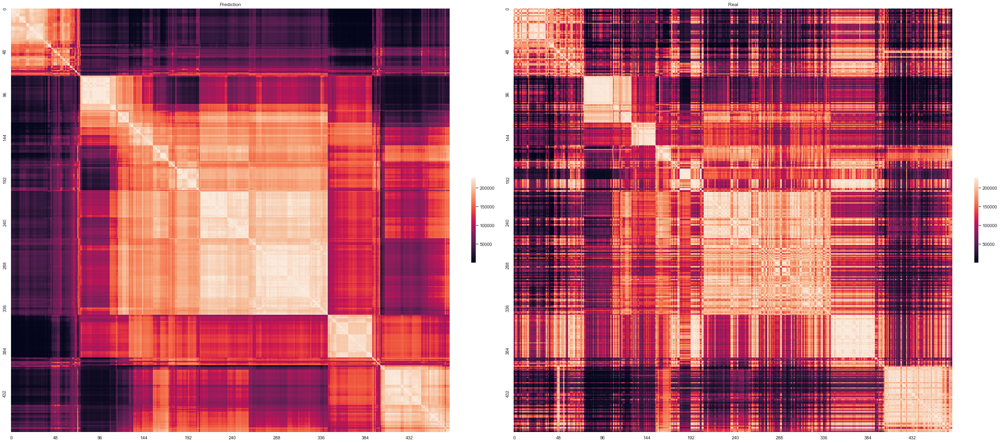

In [73]:
sns.set(font_scale=1)
fig, axs=plt.subplots(1, 2, constrained_layout=True, figsize=(34, 15))

ax = sns.heatmap(no_bam_rankmat, xticklabels=48, yticklabels=48,
                 cbar_kws={'shrink': 0.2},ax=axs[0])
ax.set_title('Prediction')

ax = sns.heatmap(rankbammat, xticklabels=48, yticklabels=48,
                 cbar_kws={'shrink': 0.2},ax=axs[1])
ax.set_title('Real')

In [27]:
total_pre[no_bam_index]

array([[0.00755733, 0.09016927, 0.01894002, ..., 0.01980565, 0.01711934,
        0.07722299],
       [0.01155129, 0.06548914, 0.188786  , ..., 0.68496764, 0.03836594,
        0.16116303],
       [0.00356963, 0.06407057, 0.24059796, ..., 0.7313207 , 0.00698622,
        0.16844979],
       ...,
       [0.04076495, 0.02107308, 0.00641792, ..., 0.00454814, 0.55972075,
        0.04348877],
       [0.04022317, 0.01242975, 0.01325159, ..., 0.01164972, 0.54333246,
        0.04089858],
       [0.05028595, 0.01289594, 0.00945305, ..., 0.00629368, 0.7112177 ,
        0.03217328]], dtype=float32)

In [5]:
import pandas as pd

c = np.load('../visualization/{}.louvain.npy'.format(record_pattern))
pd.Series(c).to_csv('../prediction/{}.louvain_cluster.csv'.format(record_pattern), index=False, header=False)

In [4]:
# Enrichment

overlap_df = pd.read_csv('./Enrichment/interval_1k_with_explain_k19_fc2_p7_u300_cluster.txt', sep='\t')
overlap_df.columns
overlap_df

,0.252962,1.55867,0.858378,0.687268,0.802877,0.174175,0.461069,0.0822757,2.87398,0.627551,...,0.620922,5.59263,0.0817825,0.177611,0.140201,6.344,0.0220384,0.217306,0.162666,0.450129
0,0.476678,0.740843,0.667438,1.572950,1.832550,2.816850,0.373153,0.159663,0.183760,0.652565,...,0.500329,0.110817,1.309910,0.794232,2.514290,0.308921,6.338800,1.429250,5.454320,0.118213
1,1.409760,1.398030,0.768784,0.408128,1.211840,0.268977,1.463810,3.406210,0.130870,0.401263,...,1.294020,0.118215,1.211900,0.640116,0.045137,0.341041,0.208970,1.166310,0.073376,2.174700
2,0.061439,1.715070,0.635672,1.085080,0.193293,0.092923,0.144044,0.035829,3.592970,0.136356,...,0.223380,13.193400,0.028209,0.075629,0.088036,1.215930,0.005074,0.049510,0.159901,0.164183
3,0.026594,1.542570,1.013620,0.672544,0.232104,0.218038,0.116323,0.006277,4.529090,0.132773,...,0.340103,6.198490,0.025902,0.134322,0.052456,1.715270,0.040381,0.013041,0.220599,0.049859
4,0.634822,0.825806,0.529954,1.631080,1.341730,2.629000,1.954470,0.552086,0.104449,0.478131,...,1.444140,0.001776,4.428670,2.156710,0.244852,0.523008,5.228710,1.144970,1.179690,0.988973
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
422,0.422900,0.610342,0.587012,1.805130,1.998930,2.653550,0.650051,0.191709,0.083533,0.513574,...,0.507163,0.019296,2.944450,1.031460,2.120050,0.221044,9.272440,1.232570,4.492300,0.111890
423,2.731360,0.894483,0.914780,0.279436,1.844550,0.159120,0.250687,5.065460,0.123127,0.779439,...,0.570718,0.018799,0.187783,0.186961,0.044317,0.215635,0.093957,1.920570,0.061808,3.839890
424,0.273594,1.310630,0.386576,1.381560,1.003080,1.193510,3.613300,0.467636,0.042468,0.135946,...,1.472080,0.003152,6.873950,2.076260,0.030059,0.784002,4.688880,0.342907,0.079425,0.581601
425,0.168001,1.598400,1.003840,0.615758,0.471199,0.150147,0.180250,0.037709,3.849460,0.406945,...,0.293212,6.581080,0.032161,0.105345,0.038115,3.771060,0.013954,0.048890,0.042015,0.555608


In [101]:
overlap_df = overlap_df[overlap_df['state (User order)']!='Base']
overlap_df.index = overlap_df['state (User order)']

In [102]:
coding_overlap_df = overlap_df[['tair_exon.bed','tair_TE.bed']]
histone_overlap_df = overlap_df[['H3K27ac_merged.bed','H3K27me1_merged.bed','H3K27me3_merged.bed','H3K4me1_merged.bed','H3K4me2_merged.bed',
                                 'H3K4me3_merged.bed','H3K9_merged.bed']]
scmarker_overlap_df = overlap_df[['Hypocotyl_callus.top50.bed', 'Inflorescence.top50.bed','Leaf.top50.bed', 'Pollen.top50.bed', 
                                  'Root.top50.bed', 'Shoot_axis_apex.top50.bed']]


In [103]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(font_scale=1)
plt.figure(figsize=(14, 12))

plt.tight_layout()

<Figure size 1400x1200 with 0 Axes>

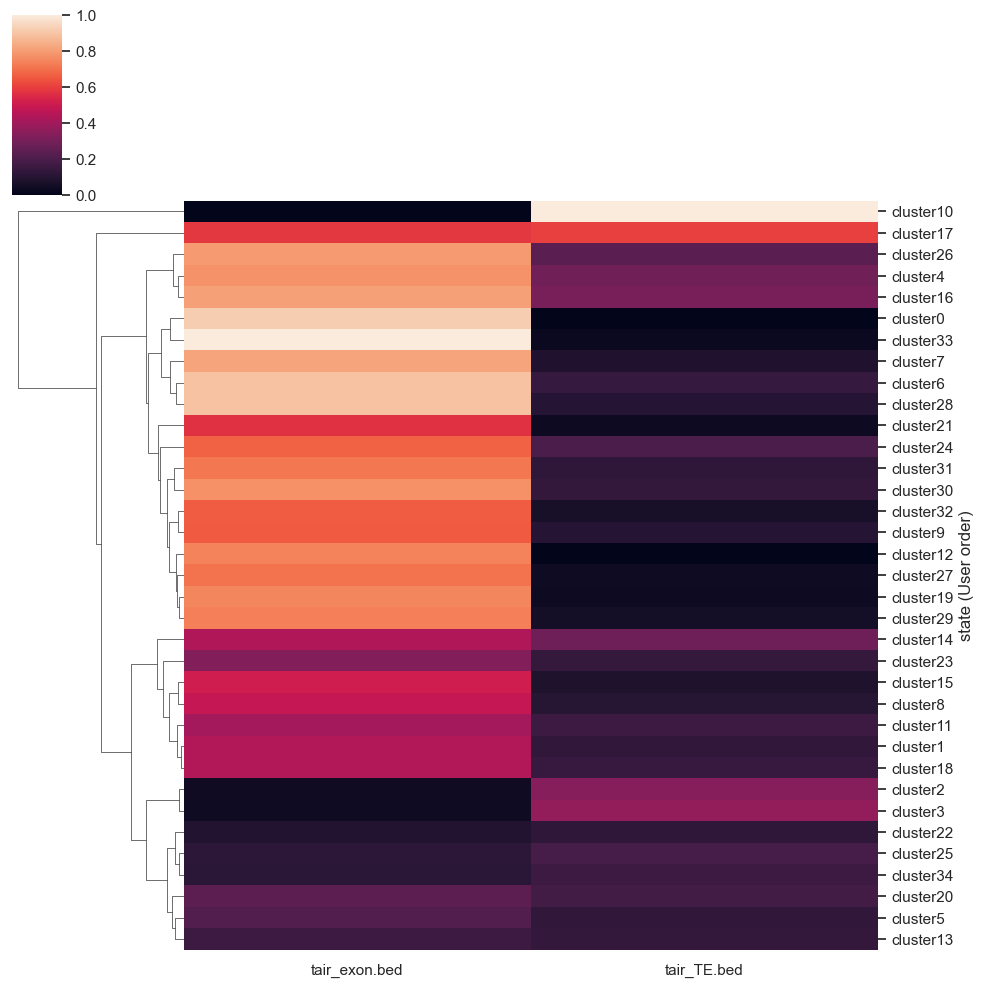

In [107]:
sns.clustermap(coding_overlap_df,standard_scale=True, col_cluster=False, row_cluster=True)

In [140]:
# histone_threshold = 0.8

# histone_overlap_df_new = (histone_overlap_df-histone_overlap_df.min())/(histone_overlap_df.max()-histone_overlap_df.min())
# histone_overlap_df_new[histone_overlap_df_new>=histone_threshold] = 1
# histone_overlap_df_new[histone_overlap_df_new<histone_threshold] = 0

histone_overlap_df_new = (histone_overlap_df-histone_overlap_df.mean())/histone_overlap_df.std()

In [141]:
histone_overlap_df_new

,H3K27ac_merged.bed,H3K27me1_merged.bed,H3K27me3_merged.bed,H3K4me1_merged.bed,H3K4me2_merged.bed,H3K4me3_merged.bed,H3K9_merged.bed
state (User order),,,,,,,
cluster15,0.097759,-0.111671,0.950519,-0.591729,-0.362313,0.026567,0.212222
cluster5,-0.765808,-0.076773,1.195675,-1.003735,-1.224849,-1.006315,-0.666090
cluster32,1.401994,-1.301919,1.419709,-0.855483,0.137175,1.177399,0.788228
cluster31,0.136983,0.068153,-0.491787,0.710810,0.588301,0.287400,0.230628
cluster1,-0.192552,0.058335,1.487279,-0.714835,-0.662154,-0.296737,0.091139
cluster8,-0.313676,-0.004678,-0.135290,0.159775,-0.076080,-0.321234,-0.263820
cluster9,-0.674513,-0.241179,-1.428615,1.545488,0.945513,-0.300852,-0.787085
cluster11,-0.586371,0.402253,0.584587,-0.302876,-0.601913,-0.676453,-0.199982
cluster10,-1.224944,1.502510,-0.302089,-1.195487,-1.608296,-1.467015,-1.705043


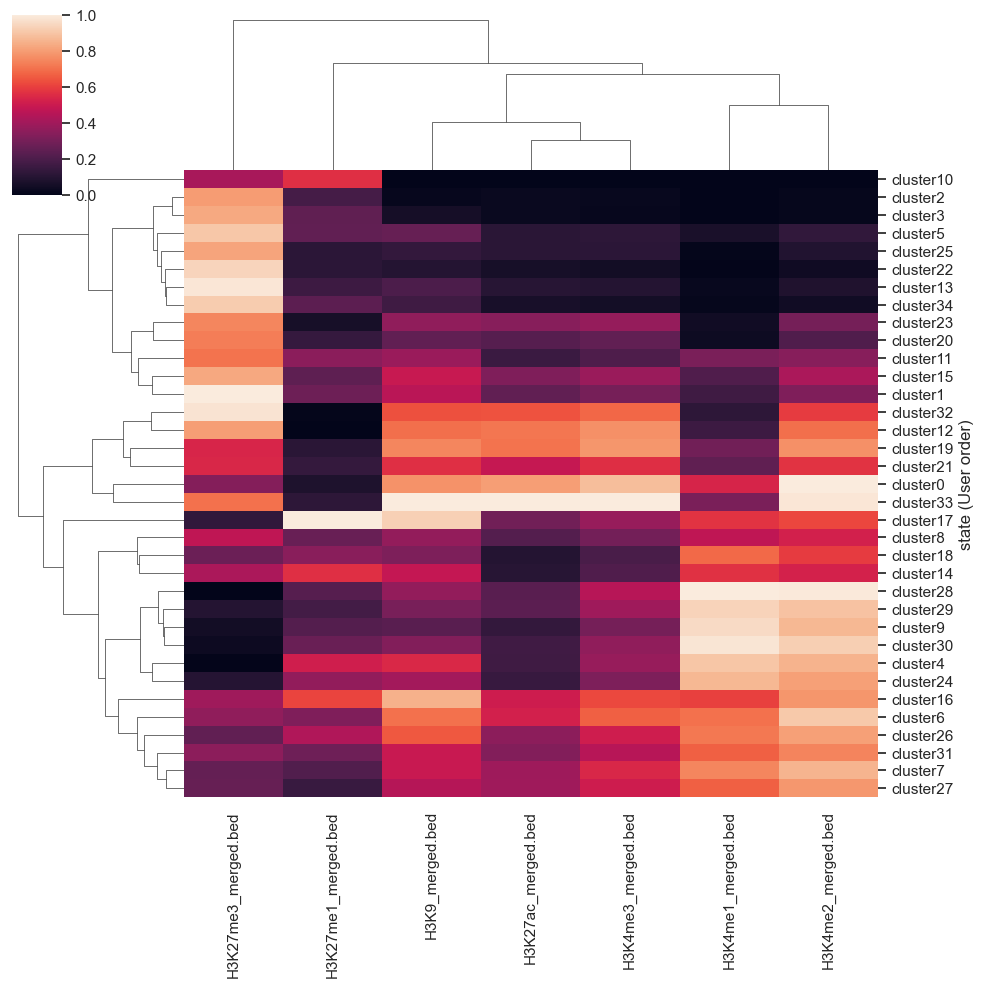

In [143]:
sns.clustermap(histone_overlap_df_new, standard_scale=True)

In [113]:
scmarker_overlap_df_new = scmarker_overlap_df.T/scmarker_overlap_df.max(axis=1)[scmarker_overlap_df.max(axis=1)!=0]

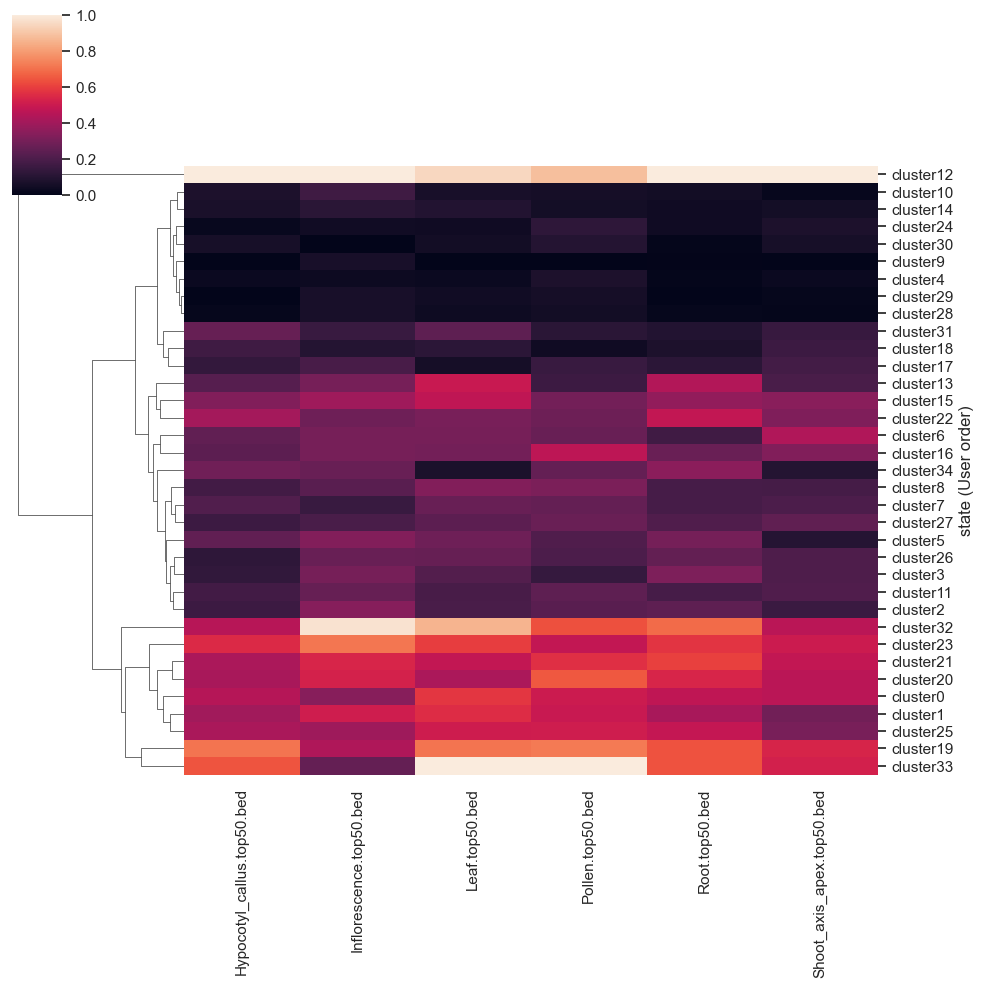

In [115]:
sns.clustermap(scmarker_overlap_df,standard_scale=True, col_cluster=False, row_cluster=True)

In [5]:
# Fold Enrichment

chip_enrich = pd.read_csv('../enrichment/explain_k19_fc2_p7_u200_seq1000_enrichment.tsv', sep='\t', header=None)
row_names = [ rec.strip().strip('.narrowPeak.bed') for rec in open('../enrichment/chip_list.txt').readlines() ]
col_names = [ 'cluster'+str(i) for i in range(0,47) ]

D:\Anaconda3\envs\ML\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.


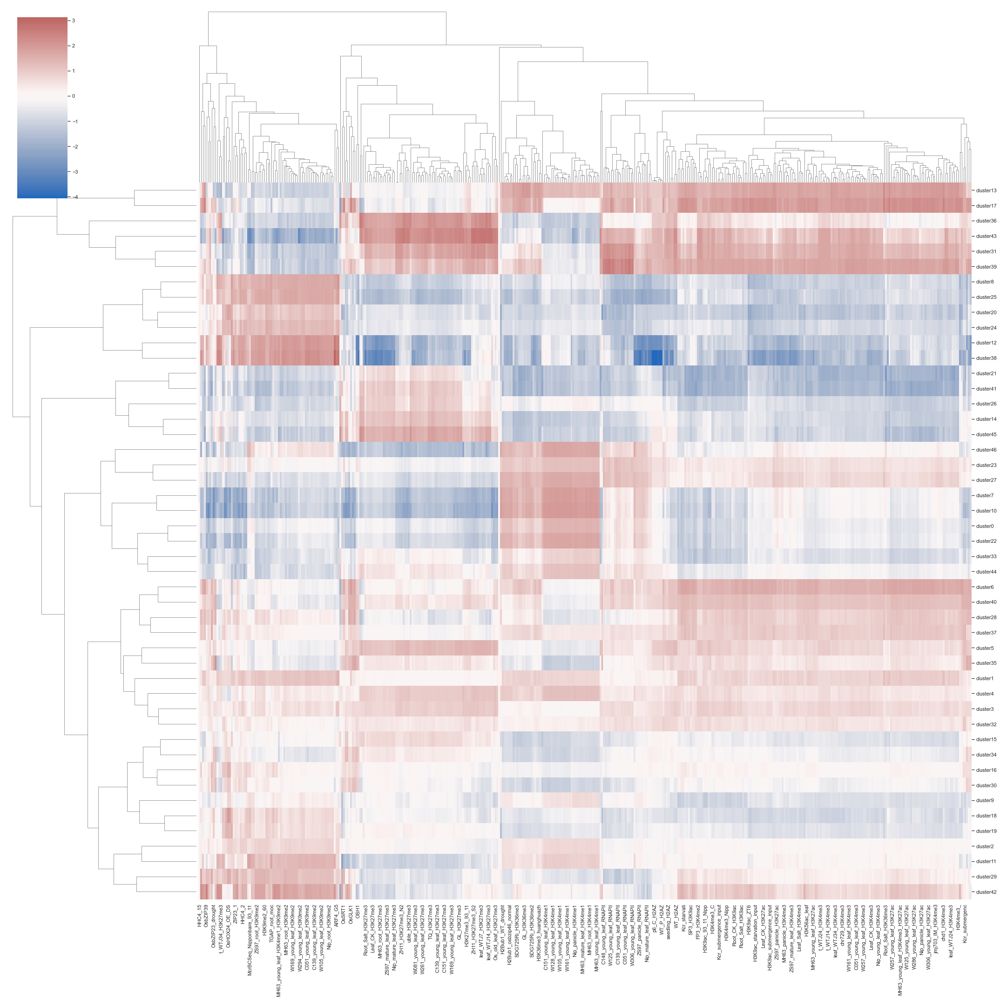

In [38]:
import seaborn as sns

sns.set(font_scale=1)
sns.clustermap(chip_enrich_log, z_score=True, cmap='vlag', mask=chip_enrich_log==-1000, center=0,  figsize=(30, 30))

In [101]:
# Fold Enrichment(marker version)

atac_enrich = pd.read_csv('../enrichment/explain_k19_fc2_p7_u200_seq1000_ATAC_enrichment.tsv', sep='\t', header=None)
histone_enric = pd.read_csv('../enrichment/explain_k19_fc2_p7_u200_seq1000_histone_enrichment.tsv', sep='\t', header=None)
tfbs_enrich = pd.read_csv('../enrichment/explain_k19_fc2_p7_u200_seq1000_TFBS_enrichment.tsv', sep='\t', header=None)
otfbs_enrich = pd.read_csv('../enrichment/explain_k19_fc2_p7_u200_seq1000_old_TFBS_enrichment.tsv', sep='\t', header=None)

row_names = [ rec.strip().strip('.narrowPeak.bed') for rec in open('../enrichment/ATAC_list.txt').readlines() ]
atac_enrich.index = row_names
row_names = [ rec.strip().strip('.narrowPeak.bed') for rec in open('../enrichment/histone_list.txt').readlines() ]
histone_enric.index = row_names
row_names = [ rec.strip().strip('.narrowPeak.bed') for rec in open('../enrichment/TFBS_list.txt').readlines() ]
tfbs_enrich.index = row_names
row_names = [ rec.strip().strip('.narrowPeak.bed') for rec in open('../enrichment/old_TFBS_list.txt').readlines() ]
otfbs_enrich.index = row_names

col_names = [ 'cluster'+str(i) for i in range(0,47) ]
atac_enrich.columns = col_names
histone_enric.columns = col_names
tfbs_enrich.columns = col_names
otfbs_enrich.columns = col_names

In [102]:
atac_enrich_log = np.log2(atac_enrich.T)
atac_enrich_log = atac_enrich_log.replace(-np.inf, -1000)

histone_enric_log = np.log2(histone_enric.T)
histone_enric_log = histone_enric_log.replace(-np.inf, -1000)

tfbs_enrich_log = np.log2(tfbs_enrich.T)
tfbs_enrich_log = tfbs_enrich_log.replace(-np.inf, -1000)

otfbs_enrich_log = np.log2(otfbs_enrich.T)
otfbs_enrich_log = otfbs_enrich_log.replace(-np.inf, -1000)

D:\Anaconda3\envs\ML\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log2


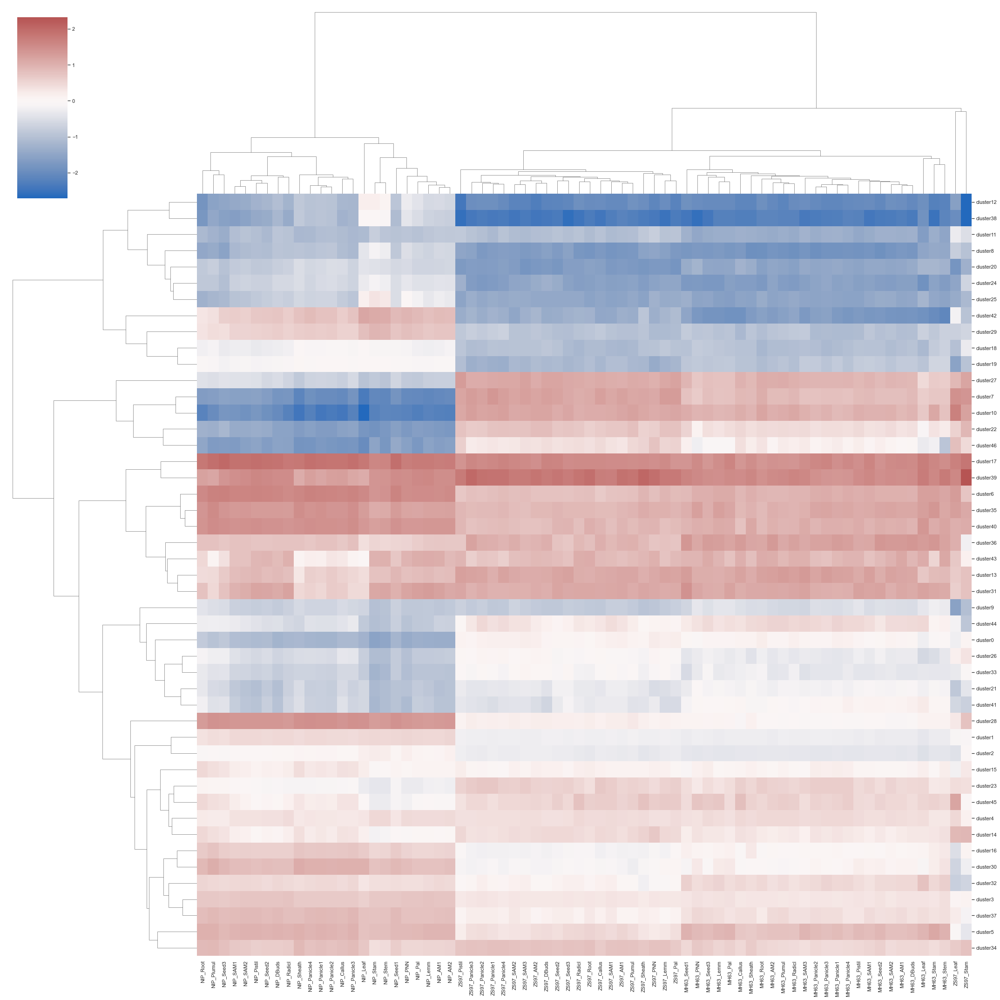

In [66]:
import seaborn as sns

sns.set(font_scale=1)
sns.clustermap(atac_enrich_log, z_score=True, cmap='vlag', mask=atac_enrich_log==-1000, center=0,  figsize=(30, 30))

In [84]:
new_order_cluster = ['cluster{}'.format(i) for i in histone_clus.dendrogram_row.reordered_ind]
tfbs_enrich_log = tfbs_enrich_log.reindex(new_order_cluster)

In [93]:
(tfbs_enrich_log.T/tfbs_enrich_log.T.max()).T

,ARF4_G5,ARF4_G8,p6_C_H2AZ,p6_P_H2AZ,ZIP23_1,ZIP23_2,ZIP23_9,callus_H2AZ,G4,H2AZ,...,OSH1,OsIDS1,OsMADS29,OsNAC6_Pol2_2,OsNF_YB1,OsSRT1,OsTGAP1,A64s_5hmC,ROG1,SDG711
cluster13,-1.542547,-2.077684,0.605687,0.601628,-0.632045,-2.104635,-1.576420,0.733118,-0.665613,0.587263,...,-0.187535,-0.071579,0.141818,0.049472,-0.678434,0.232712,-0.374806,-1.373812,-1.628278,-0.457488
cluster17,-1.005212,-1.391066,0.384912,0.390795,0.002528,-1.084348,-0.079983,0.614870,0.058742,0.295176,...,0.336134,0.222523,0.401286,0.435239,-0.129029,0.570205,0.200654,-0.458732,-1.043120,-0.132175
cluster43,-2.619437,-1.591099,0.786495,0.764514,-0.711808,-1.726045,-1.574647,0.949386,-1.422022,1.000000,...,-0.126369,-0.275092,0.477544,-0.131148,0.344234,-0.039015,0.232558,-1.627928,-1.033579,0.858893
cluster31,-2.233695,-1.834450,0.789209,0.769260,-0.667008,-1.331465,-1.291488,1.000000,-1.134406,0.958516,...,-0.080041,-0.159098,0.622686,-0.102547,0.131699,-0.075803,0.171761,-1.367991,-1.287627,0.827869
cluster39,-2.001366,-2.049231,0.805612,0.789146,-0.522687,-1.486570,-0.847216,1.000000,-0.751469,0.895466,...,0.225794,-0.036247,0.652884,0.127575,0.090623,0.265928,0.179608,-1.301072,-1.223043,0.664788
cluster9,14.513654,14.707619,5.044634,4.809686,11.318006,16.760756,13.810786,15.447930,12.079434,6.756261,...,2.577629,2.407328,4.752241,9.118010,28.444685,3.874235,1.998658,1.000000,3.348763,11.071237
cluster26,-20.225870,-23.121207,-2.145625,-1.904838,-16.121038,-20.272624,-21.088851,-14.600030,-20.141288,-3.424171,...,1.000000,-5.635641,-3.383929,-1.902440,-37.423002,-0.885023,0.921072,-8.695370,-13.230439,-15.677919
cluster33,-132.970804,-130.532595,-19.547423,-17.627114,-122.591978,-170.035113,-133.996181,-111.904962,-118.119597,-36.264025,...,1.000000,-31.276222,-20.307912,-14.949055,-254.057095,-10.492207,-6.417070,-64.342188,-80.652041,-116.149092
cluster44,-15.423030,-22.268643,0.871031,1.000000,-19.920152,-30.134248,-17.040973,-7.745600,-16.265614,-0.454708,...,0.956021,-4.221700,-2.035212,-1.031555,-25.850929,0.986130,-0.020516,-7.488889,-14.272097,-11.320002
cluster11,-0.552322,-0.782471,-0.491837,-0.501697,-1.488473,-2.107458,-0.520084,-0.820281,0.025828,-0.406266,...,-2.035996,0.186750,-0.542704,-2.370415,-2.090527,-1.298047,-1.309603,0.787878,-0.075937,-0.070471


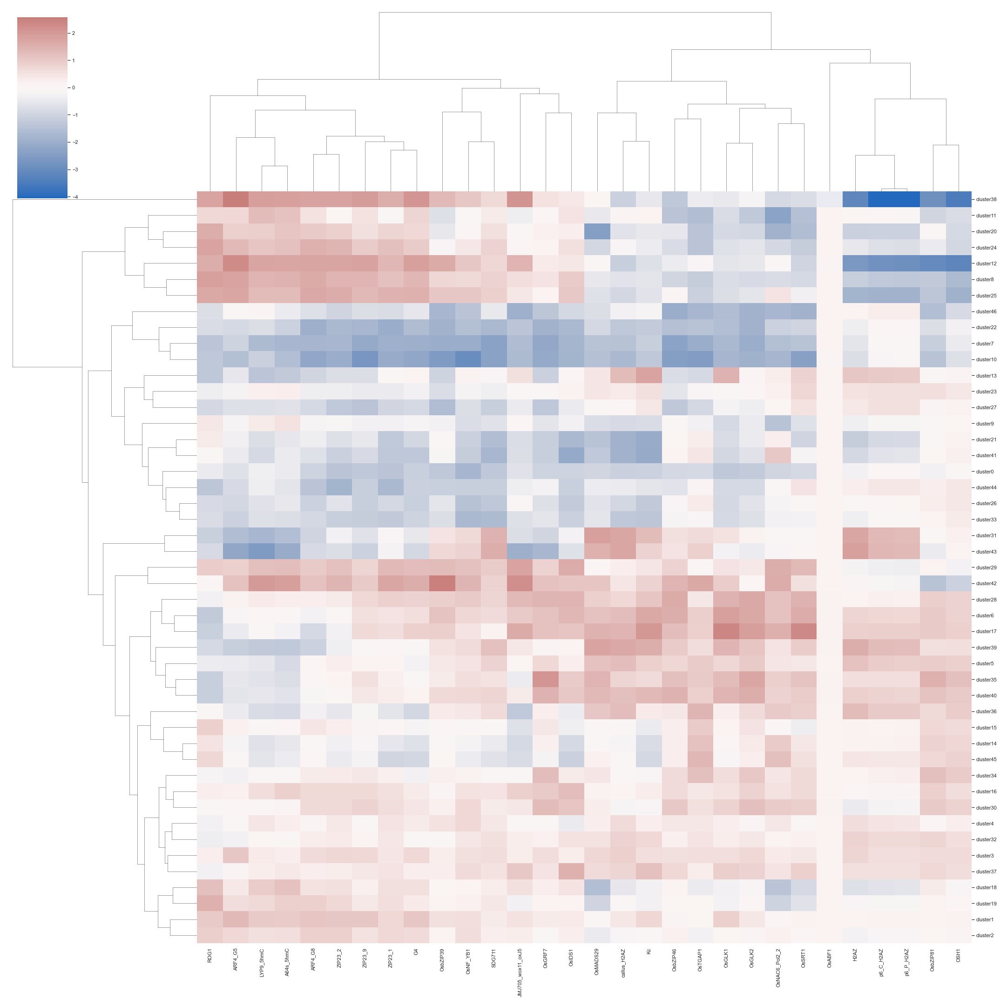

In [104]:
import seaborn as sns

sns.set(font_scale=1)
sns.clustermap(tfbs_enrich_log, z_score=True, cmap='vlag', mask=tfbs_enrich_log==-1000, center=0, figsize=(30, 30))

In [111]:
otfbs_enrich_log.columns

Index(['BSRD1', 'ZIP73', 'JMJ705', 'OsABF1', 'OsbZIP23', 'OsbZIP81', 'OsGRF4',
       'OsGRF6', 'OSH1', 'OsIDS1', 'OsMADS29', 'OsNAC10', 'OsNAC2', 'OsNAC5',
       'OsNAC6', 'OsNAC9', 'OsNFYB1', 'OsTF1L', 'OsTGAP1', 'OsWRKY46',
       'OsWRKY72', 'SNAC1'],
      dtype='object')

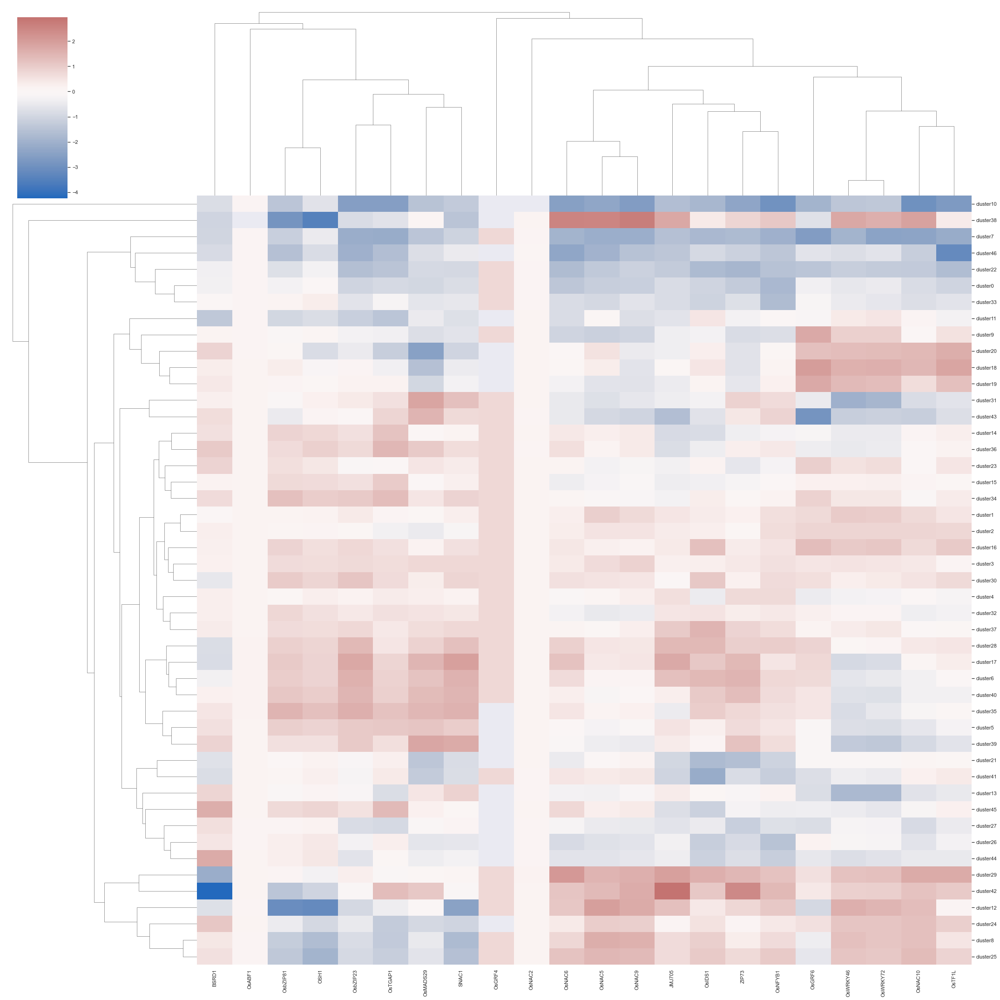

In [114]:
import seaborn as sns

sns.set(font_scale=1)
sns.clustermap(otfbs_enrich_log, z_score=True, cmap='vlag', mask=otfbs_enrich_log==-1000, center=0, figsize=(30, 30))

In [131]:
new_order_cluster = ['cluster{}'.format(i) for i in histone_clus.dendrogram_row.reordered_ind]
otfbs_enrich_log_new = otfbs_enrich_log.reindex(new_order_cluster)

In [181]:
otfbs_enrich_log_new_plot=otfbs_enrich_log_new[['BSRD1','OSH1','ZIP73','OsMADS29','OsNAC10','OsIDS1','OsGRF6','OsNFYB1', 'OsTF1L', 'OsTGAP1', 'OsWRKY46','SNAC1']]
otfbs_z_score = (otfbs_enrich_log_new_plot[otfbs_enrich_log_new_plot!=-1000]-otfbs_enrich_log_new_plot[otfbs_enrich_log_new_plot!=-1000].mean())/otfbs_enrich_log_new_plot[otfbs_enrich_log_new_plot!=-1000].std()

histone_z_score = (histone_enric_log[histone_enric_log!=-1000]-histone_enric_log[histone_enric_log!=-1000].mean())/histone_enric_log[histone_enric_log!=-1000].std()

tfbs_mat = otfbs_z_score.to_numpy()[:,otfbs_clus.dendrogram_col.reordered_ind]
histone_mat = histone_z_score.to_numpy()[histone_clus.dendrogram_row.reordered_ind][:,histone_clus.dendrogram_col.reordered_ind]

lable_row = otfbs_z_score.index

tfbs_lable_col = otfbs_z_score.columns[otfbs_clus.dendrogram_col.reordered_ind]
histone_lable_col = histone_z_score.columns[histone_clus.dendrogram_col.reordered_ind]

Text(0.5, 1.0, 'TFBS')

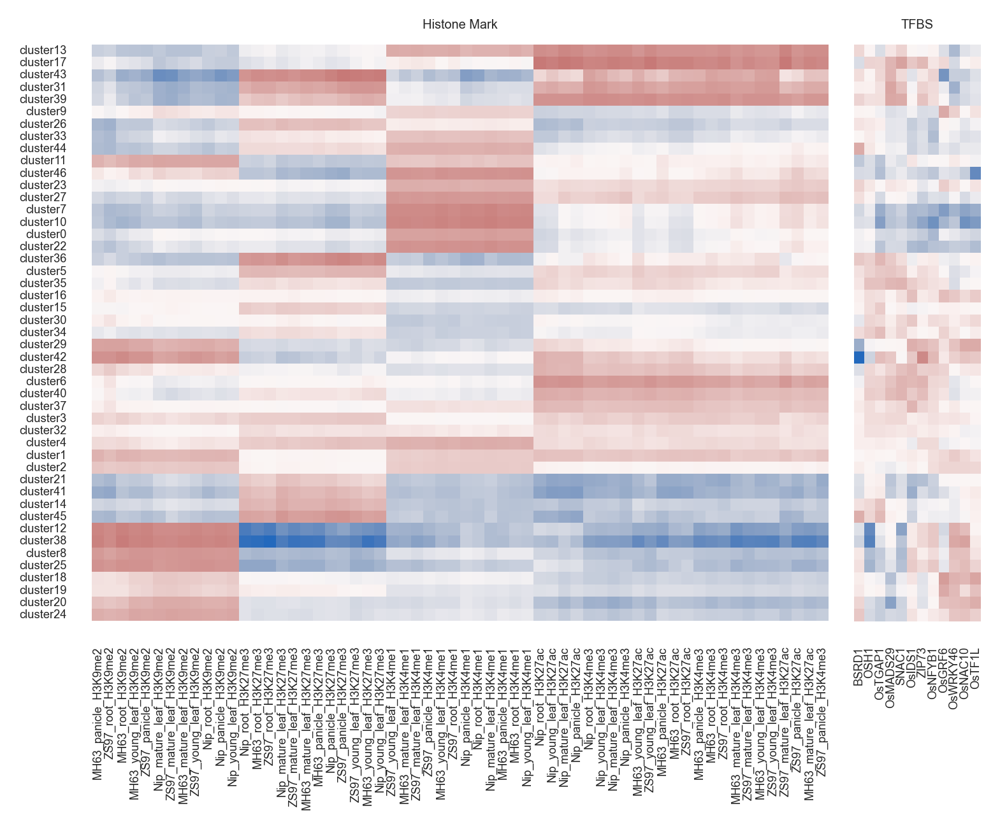

In [205]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

sns.set(font_scale=.4)
fig = plt.figure(dpi=300)
gs = GridSpec(1, 6, figure=fig)#GridSpec将fiure分为3行3列，每行三个axes，gs为一个matplotlib.gridspec.GridSpec对象，可灵活的切片figure

ax1 = fig.add_subplot(gs[0, 0:5])
ax2 = fig.add_subplot(gs[0, 5])#gs[0, 0:3]中0选取figure的第一行，0:3选取figure第二列和第三列


ax = sns.heatmap(histone_mat,cmap='vlag',mask=histone_mat==-1000, center=0, cbar=False,
                 xticklabels=histone_lable_col, yticklabels=lable_row, square=True, ax=ax1)
ax.set_title("Histone Mark")

ax = sns.heatmap(tfbs_mat,cmap='vlag',mask=tfbs_mat==-1000, center=0, cbar=False,
                 xticklabels=tfbs_lable_col, yticklabels=False, ax=ax2)
ax.set_title("TFBS")